In [1]:
import sys
import operator
import parse as p
import author_network as an
import regression as re
import numpy as np
import networkx as nx
import graphviz as gv
from matplotlib import pyplot as plt
from community import community_louvain
import collections
from node2vec import Node2Vec
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

## Reading Files and Preparing Data

### Read and parse .json files

In [2]:
files = ['../data/icml2019.json']
#files = ['../data/icml2019.json','../data/icml2018.json','../data/icml2017.json']

#files = ['../data/icml2019.json','../data/icml2018.json','../data/icml2017.json'
#        , '../data/nips2019.json', '../data/nips2018.json', '../data/nips2017.json']

#years = '(2017-2019, ICML)'
years = '(2019, ICML)'
#re_years = [2017, 2018, 2019]
re_years = [ 2019]
target = 2020
#figsize = (150,150)
figsize = (80,80)

author_list, paper_list = p.parse_json(files)

temp, temp_ = p.get_paper_count(author_list)
author_names = temp[0]
paper_counts = temp[1]
sorted_author_names = temp_[0]
sorted_paper_counts = temp_[1]

Read 1 files, 773 papers and 2410 authors


### Graph with Every Researchers

In [3]:
edges, alone = an.get_edges(author_list, paper_list)
G = nx.MultiGraph()
G.add_edges_from(edges)
G.add_nodes_from(alone)
for i in range(len(author_names)):
    G.nodes[author_names[i]]['papers'] = paper_counts[i]

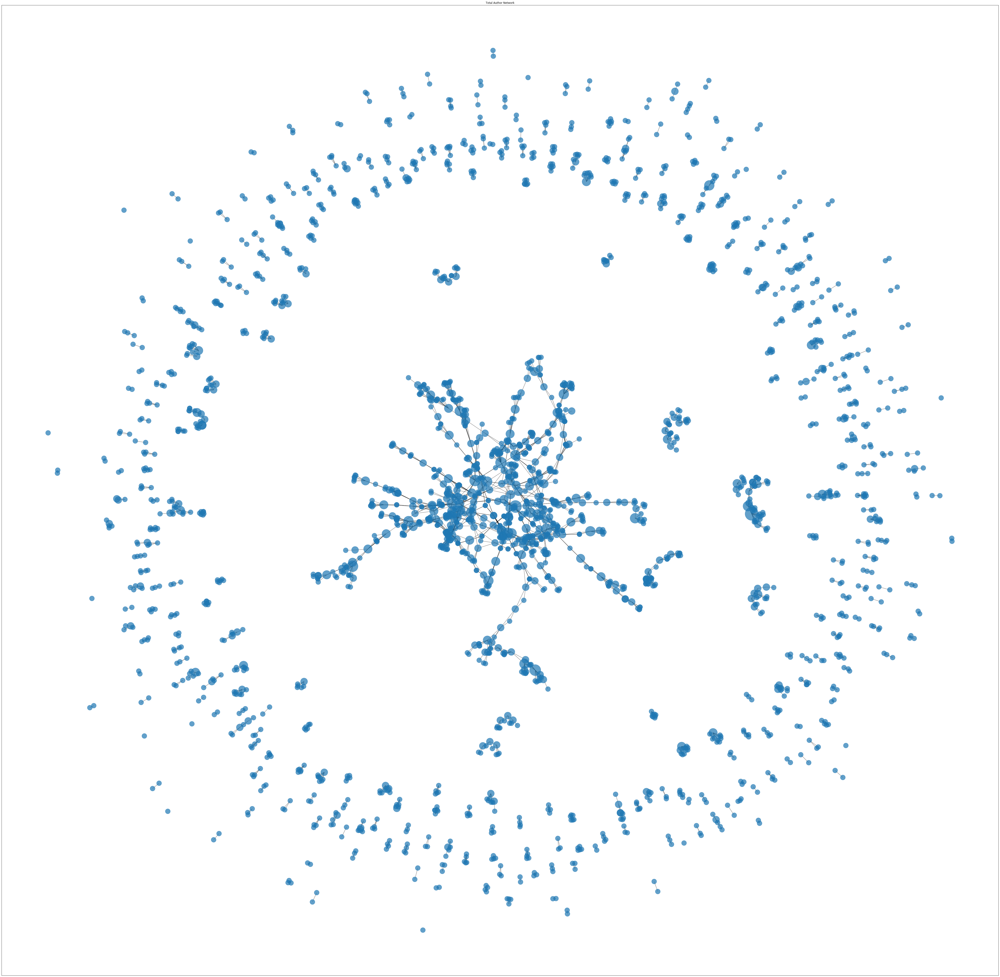

In [4]:
plt.figure(figsize = figsize)
sp = nx.spring_layout(G)
#sp = nx.random_layout(G)
node_size = [500 * nx.get_node_attributes(G, 'papers')[v] for v in G] 
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.title('Total Author Network')
plt.savefig('../image/network_graph'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Researchers with most papers

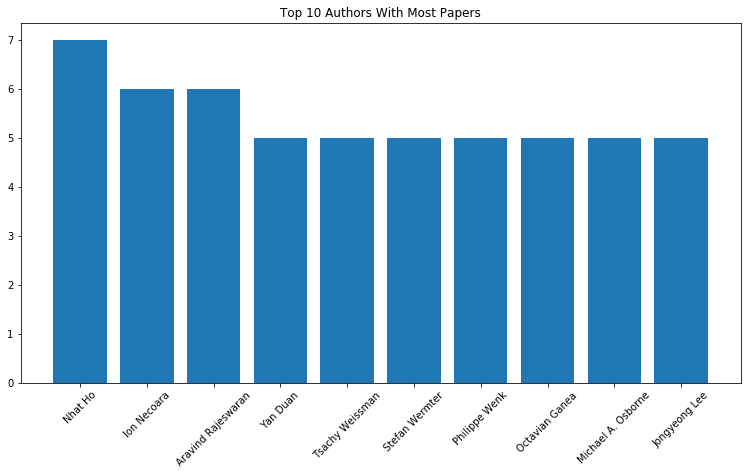

In [5]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar(sorted_author_names[:10],sorted_paper_counts[:10], width = 0.8)
plt.title('Top 10 Authors With Most Papers')
plt.savefig('../image/authors_with_most_papers'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Researchers who has been working with the most people

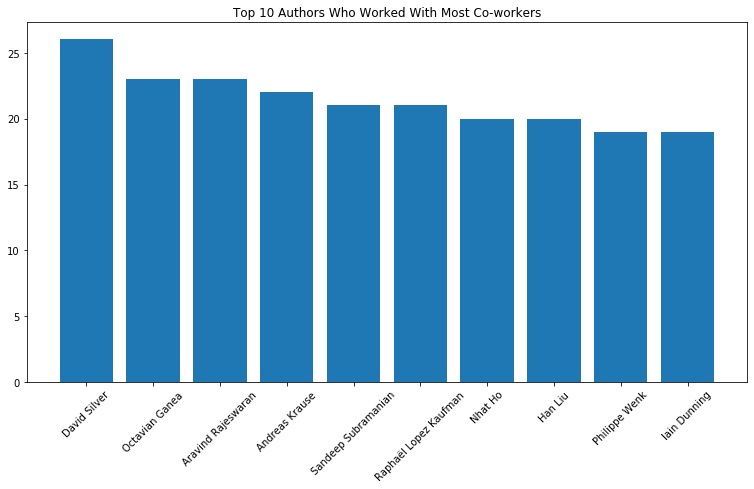

In [6]:
co_count_authors, co_counts = an.co_worker_counts(author_list)
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar(co_count_authors[:10],co_counts[:10], width = 0.8)
plt.title('Top 10 Authors Who Worked With Most Co-workers')
plt.savefig('../image/authors_working_with_most_people'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Community Detection 1 (Louvain Algorithm)

In [7]:
partition_lou = community_louvain.best_partition(G)
values_lou = [partition_lou.get(node) for node in G.nodes()]
counter_lou = collections.Counter(values_lou)
p.save_authors_csv('../image/authors_lou.csv', G, values_lou)

### Community Detection 2 (node2vec and K-means Algorithm)

In [8]:
node2vec = Node2Vec(graph=G,
                    dimensions=20,
                    walk_length=10,
                    p = 1, 
                    q = 0.0001, 
                    weight_key=None,
                    num_walks=2000, 
                    workers=1,
                   )

for i, each_walk in enumerate(node2vec.walks):
    print(f"{i:0>2d}, {each_walk}")
    if i>1:
        break

Generating walks (CPU: 1): 100%|██████████| 2000/2000 [24:22<00:00,  1.37it/s]


00, ['Clément Calauzènes', 'Thomas Nedelec', 'Pierre Perrault', 'Jennifer Healey', 'Peter Bartlett', 'Michal Valko', 'Peter Bartlett', 'Michal Valko', 'Jennifer Healey', 'Pierre Perrault']
01, ['Kai Xu', 'Charles Sutton', 'Akash Srivastava', 'Charles Sutton', 'Akash Srivastava', 'Charles Sutton', 'Kai Xu', 'Akash Srivastava', 'Kai Xu', 'Charles Sutton']
02, ['Geoffrey Hinton', 'Nicolas Papernot', 'David Ha', 'Honglak Lee', 'Ruben Villegas', 'Danijar Hafner', 'James Davidson', 'David Silver', 'Laurent Orseau', 'Mehdi Mirza']


In [9]:
model = node2vec.fit(window=10)

In [10]:
K = 5
kmeans = KMeans(n_clusters=K, random_state=0).fit(model.wv.vectors)
for n, label in zip(model.wv.index2entity, kmeans.labels_):
    G.nodes[n]['node2vec'] = label
values_nv = [n[1]['node2vec'] for n in G.nodes(data=True)]

## Part1: Important Researcher

### Researchers who has been working with the most research groups

#### 1) Simply counted version

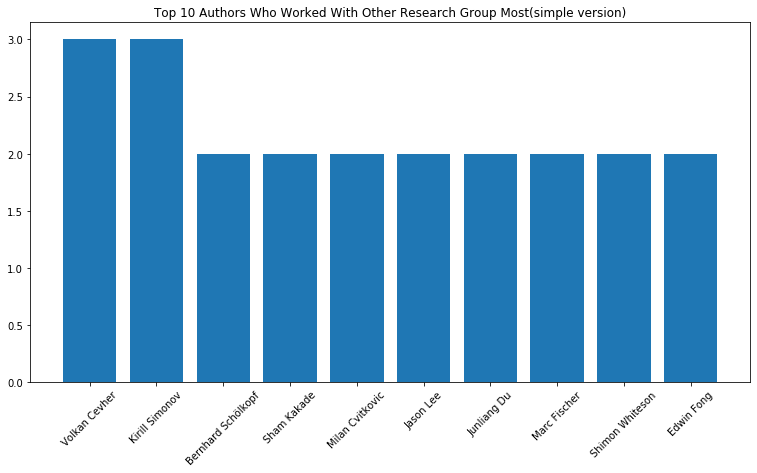

In [11]:
other_group = an.find_other_group(G, values_lou, author_list)
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar([x[0] for x in other_group ][:10], [x[1] for x in other_group ][:10], width = 0.8)
plt.title('Top 10 Authors Who Worked With Other Research Group Most(simple version)')
plt.savefig('../image/authors_with_most_research_groups_simple'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

#### 2) Betweeness centrality

In [12]:
G_b = nx.Graph(G)
Cb_dict = nx.betweenness_centrality(G_b)
Cb = sorted(Cb_dict.items(), key=operator.itemgetter(1), reverse = True)
sorted_centrality_names = [x[0] for x in Cb]
sorted_centrality_counts = [x[1] for x in Cb]

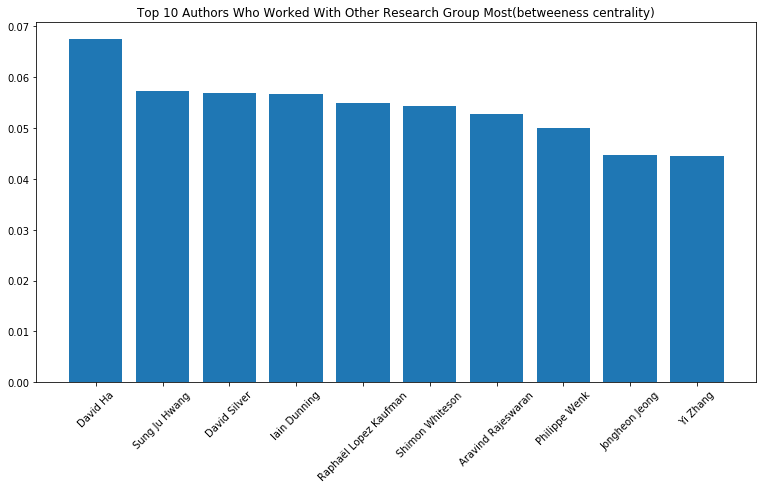

In [13]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
ax.bar(sorted_centrality_names[:10], sorted_centrality_counts[:10], width = 0.8)
plt.title('Top 10 Authors Who Worked With Other Research Group Most(betweeness centrality)')
plt.savefig('../image/authors_with_most_research_groups_betweeness'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Researchers in Graph

#### 1) Top N researchers with most papers

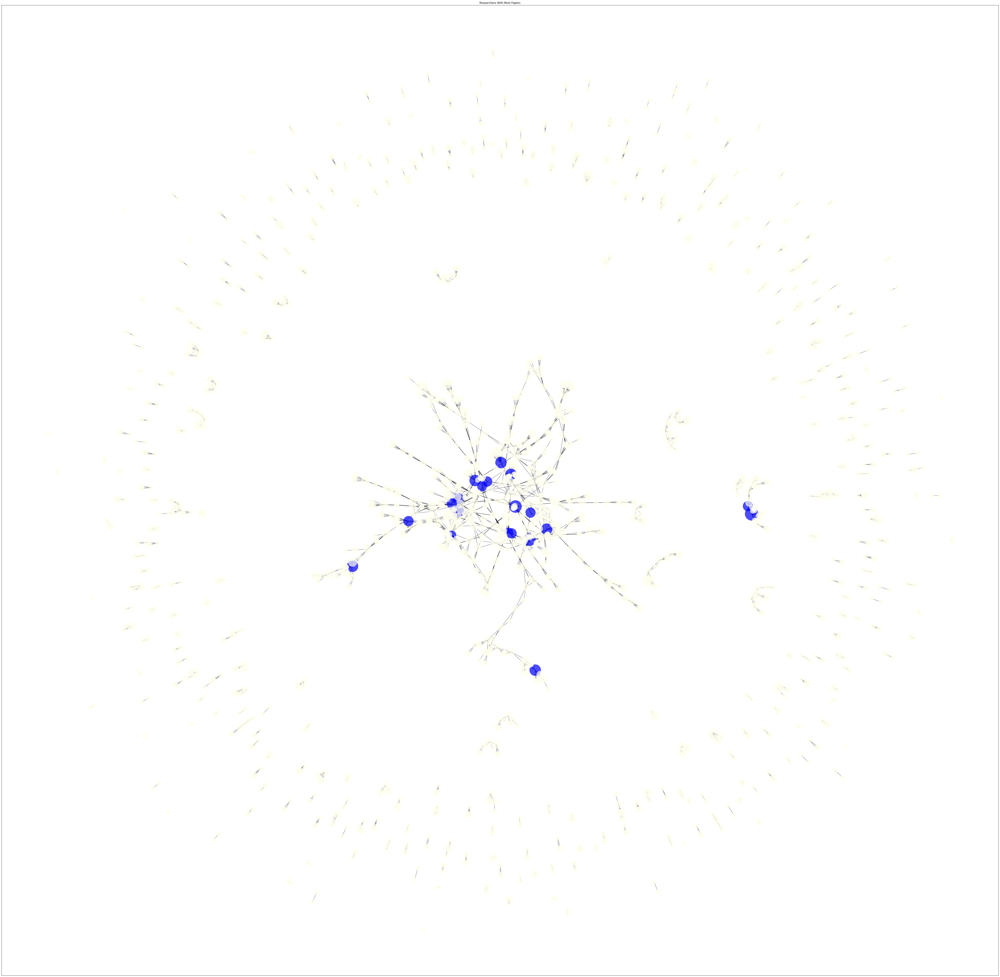

In [14]:
N = 20
paper_colormap = an.make_colormap(G, sorted_author_names, author_list, N)
plt.figure(figsize = figsize)
nx.draw_networkx(G, 
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=paper_colormap, 
                 alpha=0.7
                )
# plt.axes('off')
plt.title('Researchers With Most Papers')
plt.savefig('../image/network_graph_top_paper'+years+'.pdf', 
            bbox_inches='tight')
plt.show()


#### 2) Top N researchers of betweeness centrality

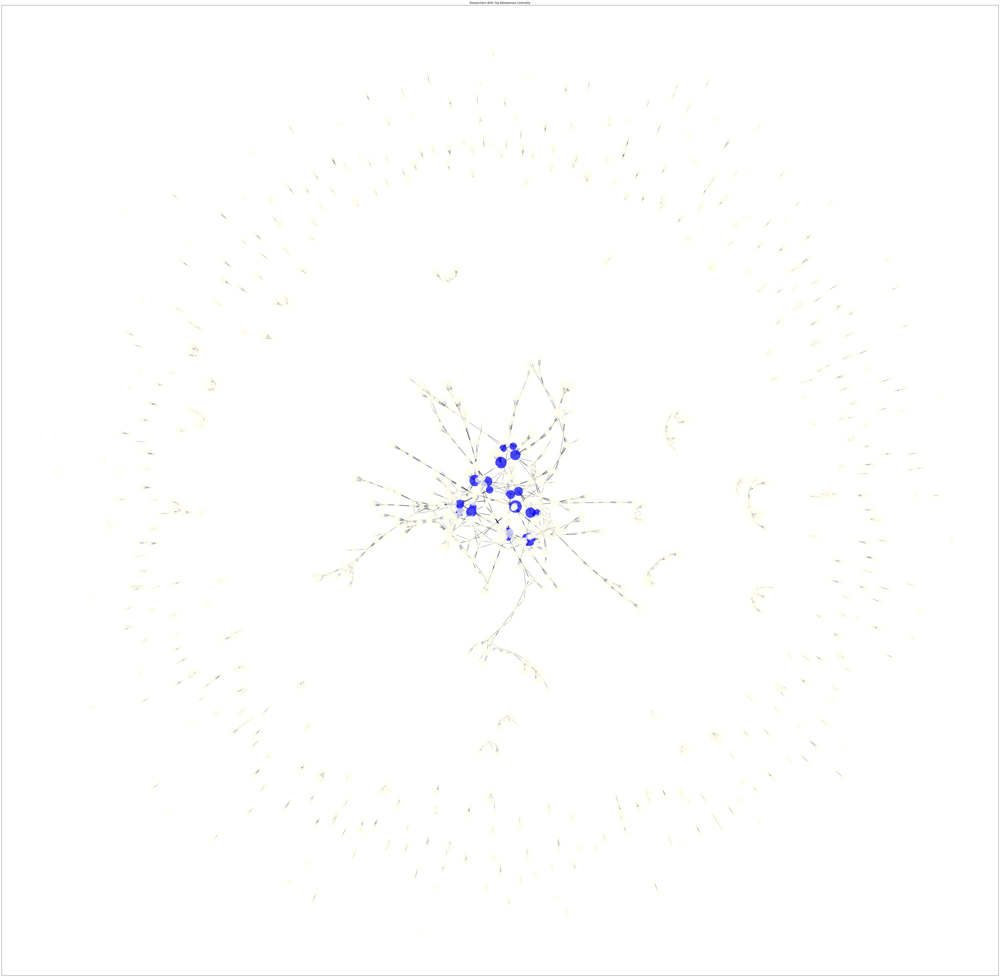

In [15]:
N = 20
centrality_colormap = an.make_colormap(G, sorted_centrality_names, author_list, N)
plt.figure(figsize = figsize) 
nx.draw_networkx(G, 
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=centrality_colormap, 
                 alpha=0.7
                )
# plt.axes('off')
plt.title('Researchers With Top Betweeness Centrality')
plt.savefig('../image/network_graph_top_paper'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Graph with only top N researchers

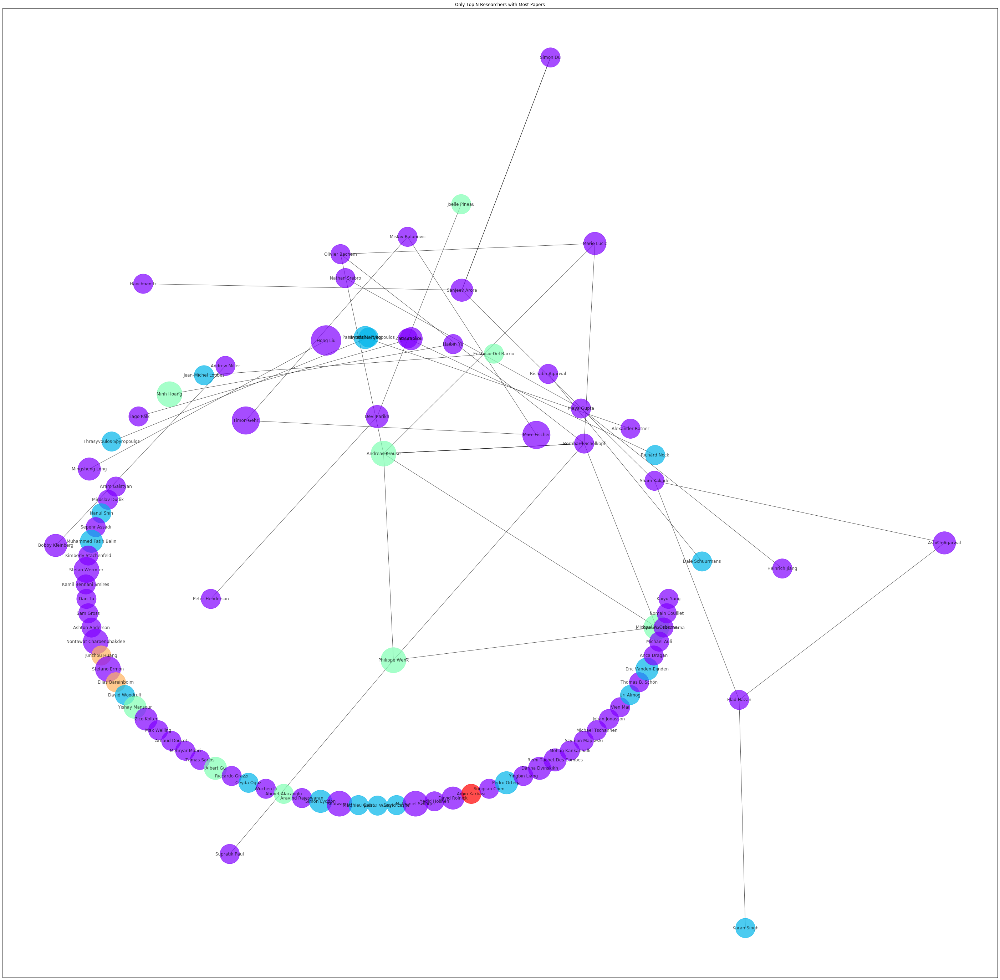

In [16]:
N = 50
G_tr, values_tr = an.get_edges_from_topN(G, paper_counts, paper_counts, author_list, paper_list, N)

plt.figure(figsize = (50,50))
sp_tr = nx.kamada_kawai_layout(G_tr)
node_size_tr = [1000 * nx.get_node_attributes(G_tr, 'papers')[v] for v in G_tr] 
nx.draw_networkx(G_tr,
                 pos=sp_tr, 
                 with_labels=True, 
                 node_size=node_size_tr,
                 node_color=values_tr, 
                 alpha=0.7,
                 cmap = plt.cm.rainbow
                )
plt.title('Only Top N Researchers with Most Papers')
plt.savefig('../image/network_graph_topN_researchers'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Predicting 2020 Researchers

In [17]:
sort_author_name, sort_author_predict = re.get_author_regression(
    author_list, paper_list, re_years, target)

[[2019, 773]]


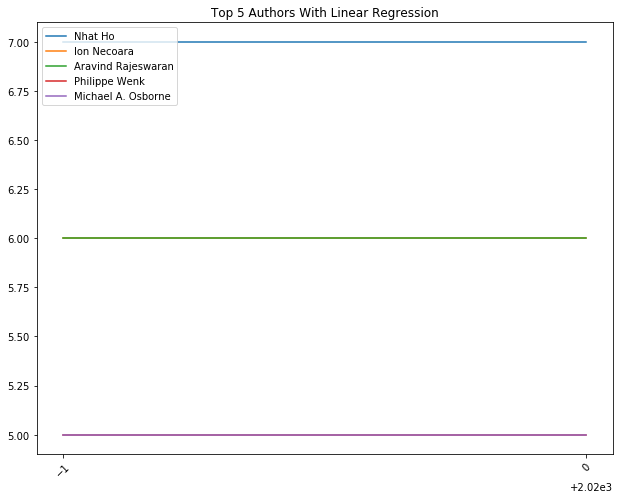

In [18]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
total_years = re_years + [target]
ax.set_xticks(total_years)
for i in range(5):
    plt.plot(total_years, sort_author_predict[i],
             label=sort_author_name[i]
            )
plt.legend(loc='upper left')
plt.title('Top 5 Authors With Linear Regression')
plt.savefig('../image/linear_regression_authors.pdf', 
            bbox_inches='tight')
plt.show()

## Part 2: Research Groups

### Total Research Groups in Graphs

#### 1) Louvain Algorithm

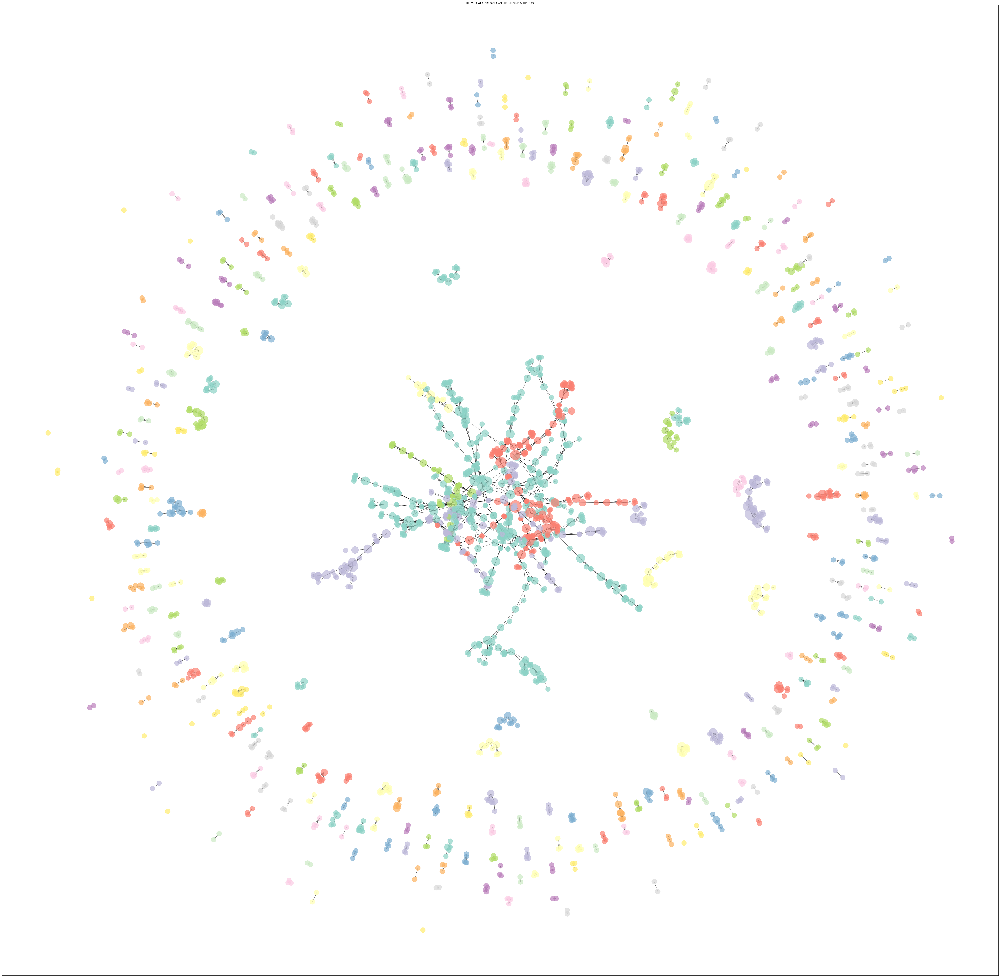

In [19]:
plt.figure(figsize = (80,80))
node_size = [500 * nx.get_node_attributes(G, 'papers')[v] for v in G] 
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=values_lou, 
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
plt.title('Network with Research Groups(Louvain Algorithm)')
plt.savefig('../image/network_graph_total_Louvain'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

#### 2) node2vec and K-means Algorithm

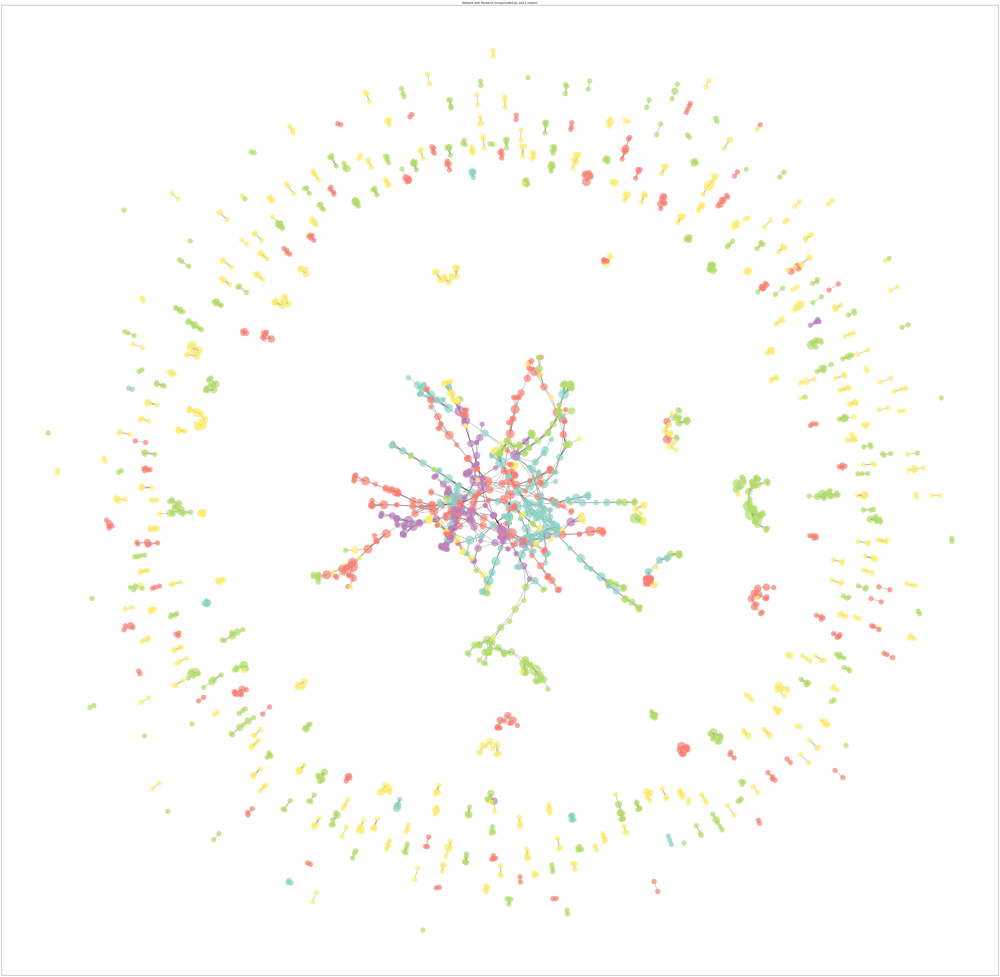

In [20]:
plt.figure(figsize = figsize)
node_size = [500 * nx.get_node_attributes(G, 'papers')[v] for v in G] 
nx.draw_networkx(G,
                 pos=sp, 
                 with_labels=False, 
                 node_size=node_size,
                 node_color=values_nv, 
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
plt.title('Network with Research Groups(node2vec and K-means)')
plt.savefig('../image/network_graph_total_node2vec'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

### Top N Research Groups in Graphs

#### 1) Louvain Algorithm

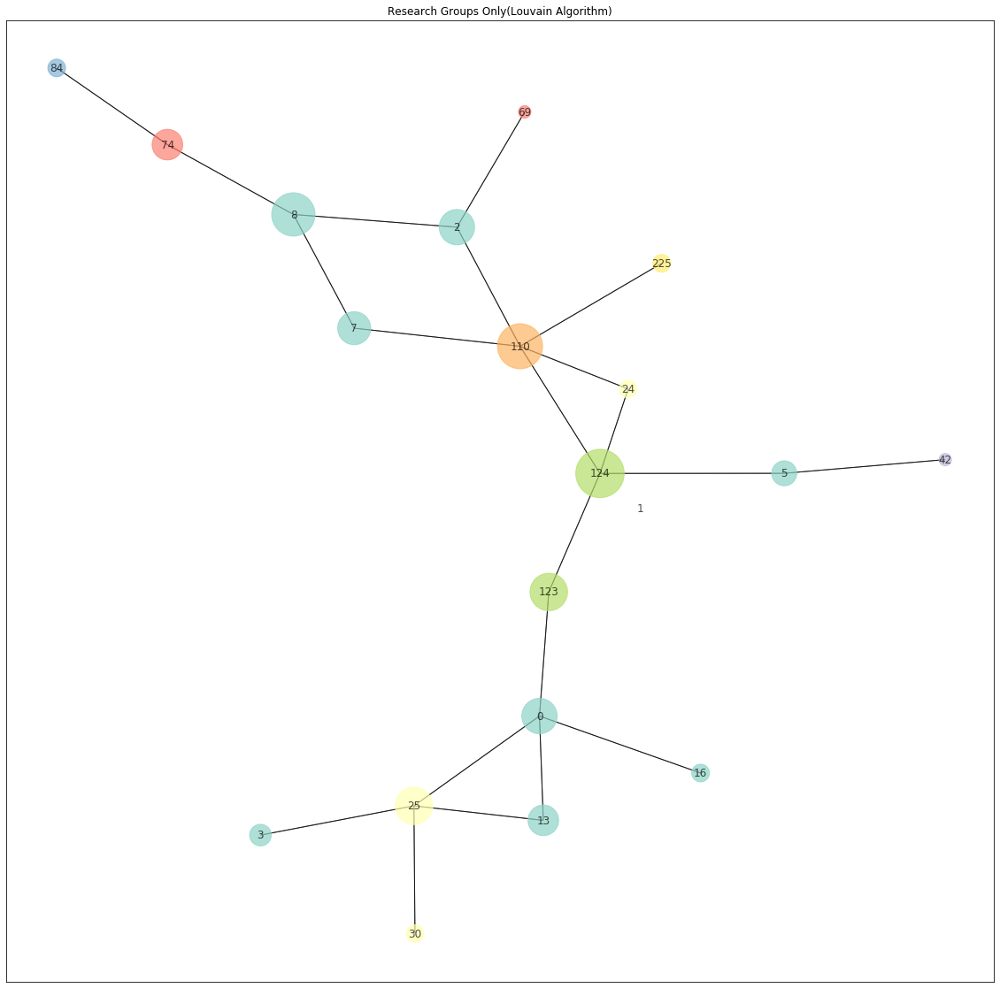

In [21]:
N = 20
group_list_lou, G_lou = an.make_research_groups(G, values_lou)
for group in group_list_lou:
    group.add_all_paper(author_list)

G_lou_, groups_lou = an.get_top_group(G, group_list_lou, N)

plt.figure(figsize =(20,20))
sp_lou = nx.kamada_kawai_layout(G_lou_)
node_size = [200 * nx.get_node_attributes(G_lou_, 'authors')[v] for v in G_lou_] 
nx.draw_networkx(G_lou_,
                 pos=sp_lou, 
                 with_labels=True, 
                 node_size=node_size, 
                 node_color=G_lou_,
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.title('Research Groups Only(Louvain Algorithm)')
plt.savefig('../image/top_research_groups_louvain'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

#### 2) node2vec and K-means Algorithm

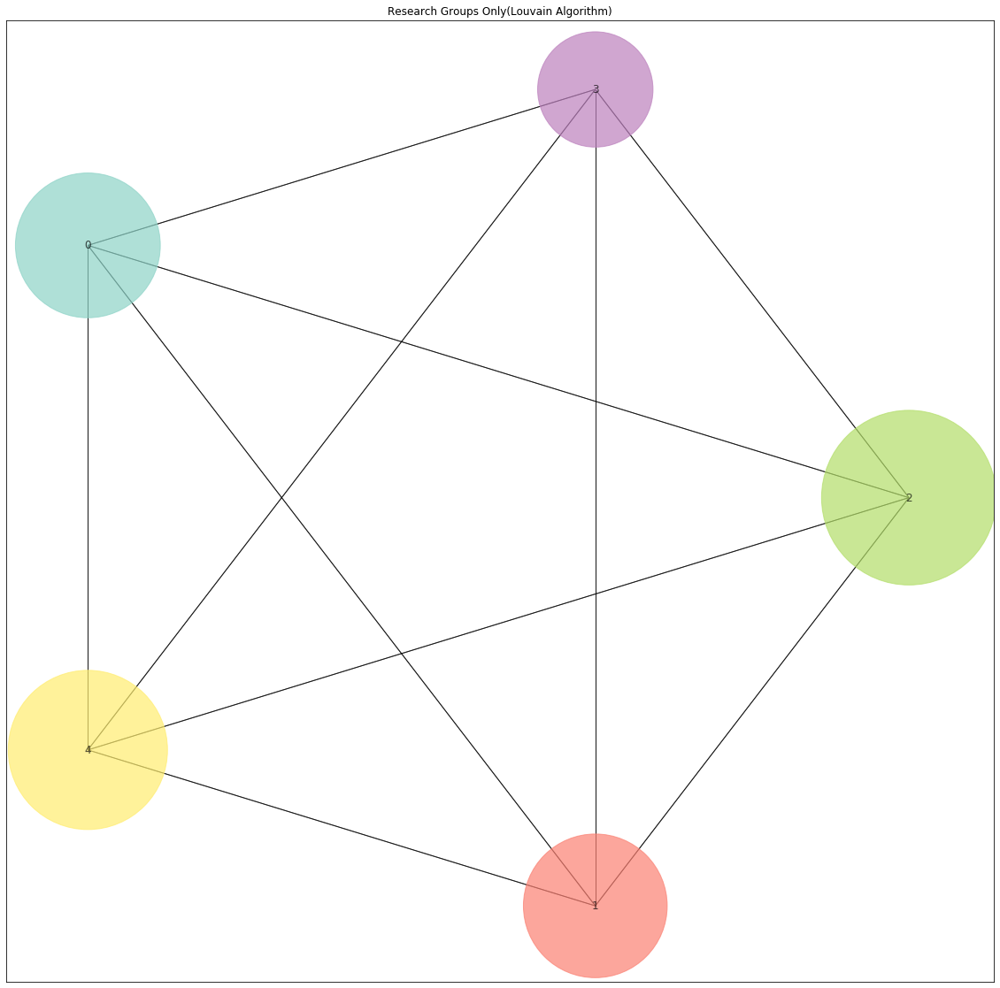

In [26]:
N = 20
group_list_nv, G_nv = an.make_research_groups(G, values_nv)
for group in group_list_nv:
    group.add_all_paper(author_list)

G_nv_, groups_nv = an.get_top_group(G, group_list_nv, N)
sp_nv = nx.kamada_kawai_layout(G_nv_)
plt.figure(figsize =(20,20))
sp_lou = nx.kamada_kawai_layout(G_nv_)
node_size = [200 * nx.get_node_attributes(G_nv_, 'authors')[v] for v in G_nv_] 
nx.draw_networkx(G_nv_,
                 pos=sp_nv, 
                 with_labels=True, 
                 node_size=node_size, 
                 node_color=G_nv_,
                 alpha=0.7,
                 cmap = plt.cm.Set3
                )
# plt.axes('off')
plt.title('Research Groups Only(Louvain Algorithm)')
plt.savefig('../image/top_research_groups_node2vec'+years+'.pdf', 
            bbox_inches='tight')
plt.show()

In [29]:
values_nv

[3,
 3,
 3,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 3,
 1,
 1,
 1,
 1,
 4,
 4,
 4,
 4,
 0,
 0,
 2,
 2,
 2,
 2,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 4,
 4,
 4,
 4,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 3,
 4,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 2,
 2,
 4,
 4,
 4,
 2,
 2,
 2,
 2,
 4,
 4,
 4,
 4,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 3,
 3,
 3,
 3,
 4,
 4,
 2,
 2,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 4,
 4,
 4,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 4,
 4,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 4,
 4,
 4,
 0,
 0,
 0,
 0,
 0,
 4,
 4,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 4,
 4,
 4,
 4,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


### Checking: Revealing Research Groups

### Predicting 2020 Research Groups

#### 1) Louvain Algorithm

In [ ]:
sort_group_name_lou, sort_group_predict_lou = re.get_group_regression(
    group_list_lou, paper_list, re_years, target)

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
total_years = re_years + [target]
ax.set_xticks(total_years)
for i in range(5):
    plt.plot(total_years, sort_group_predict_lou[i], 
             label=str(sort_group_name_lou[i])
            )
plt.legend(loc='upper left')
plt.title('Top 5 Research Groups With Linear Regression')
plt.savefig('../image/linear_regression_research_groups_louvain.pdf', 
            bbox_inches='tight')
plt.show()

#### 2) node2vec and K-means Algorithm

In [ ]:
sort_group_name_nv, sort_group_predict_nv = re.get_group_regression(
    group_list_nv, paper_list, re_years, target)

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_axes([0,0,1,1])
for label in ax.xaxis.get_ticklabels() :
    label.set_rotation(45)
total_years = re_years + [target]
ax.set_xticks(total_years)
for i in range(5):
    plt.plot(total_years, sort_group_predict_nv[i], 
             label=str(sort_group_name_nv[i])
            )
plt.legend(loc='upper left')
plt.title('Top 5 Research Groups With Linear Regression')
plt.savefig('../image/linear_regression_research_groups_node2vec.pdf', 
            bbox_inches='tight')
plt.show()